In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
# Import label encoder
from sklearn import preprocessing
import seaborn as sns
import matplotlib.pyplot as plt
# from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
# read_file = pd.read_csv (r'D:\After_war\Tutorial\Scalar docs\project\LoanTap\logistic_regression.txt')
# read_file.to_csv (r'D:\After_war\Tutorial\Scalar docs\project\LoanTap\logistic_regression.csv', index=None)

In [2]:
data = pd.read_csv (r'D:\After_war\Tutorial\Scalar docs\project\LoanTap\logistic_regression.csv')
data.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


In [3]:
data[data.duplicated()==True]

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

<h5><u>Get the target column :</u></h5>

In [5]:
# # target column 
data['loan_status'].unique()

array(['Fully Paid', 'Charged Off'], dtype=object)

In [6]:
label_encoder = preprocessing.LabelEncoder()
# Encode labels in column 'species'.
data['loan_status']= label_encoder.fit_transform(data['loan_status'])
data['loan_status'].unique()

array([1, 0])

In [7]:
print(label_encoder.inverse_transform([1, 0]))

# print(label_encoder.classes_)

['Fully Paid' 'Charged Off']


In [8]:
data['loan_status'].value_counts()

1    318357
0     77673
Name: loan_status, dtype: int64

In [9]:
data.describe()

,loan_amnt,int_rate,installment,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,396030.000000,396030.000000,396030.000000,3.960300e+05,396030.000000,396030.000000,396030.000000,396030.000000,3.960300e+05,395754.000000,396030.000000,358235.000000,395495.000000
mean,14113.888089,13.639400,431.849698,7.420318e+04,0.803871,17.379514,11.311153,0.178191,1.584454e+04,53.791749,25.414744,1.813991,0.121648
std,8357.441341,4.472157,250.727790,6.163762e+04,0.397068,18.019092,5.137649,0.530671,2.059184e+04,24.452193,11.886991,2.147930,0.356174
min,500.000000,5.320000,16.080000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,2.000000,0.000000,0.000000
25%,8000.000000,10.490000,250.330000,4.500000e+04,1.000000,11.280000,8.000000,0.000000,6.025000e+03,35.800000,17.000000,0.000000,0.000000
50%,12000.000000,13.330000,375.430000,6.400000e+04,1.000000,16.910000,10.000000,0.000000,1.118100e+04,54.800000,24.000000,1.000000,0.000000
75%,20000.000000,16.490000,567.300000,9.000000e+04,1.000000,22.980000,14.000000,0.000000,1.962000e+04,72.900000,32.000000,3.000000,0.000000
max,40000.000000,30.990000,1533.810000,8.706582e+06,1.000000,9999.000000,90.000000,86.000000,1.743266e+06,892.300000,151.000000,34.000000,8.000000


In [10]:
data.shape

(396030, 27)

In [11]:
data.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                37795
pub_rec_bankruptcies      535
address                     0
dtype: int64

In [12]:
data = data.dropna()

In [13]:
data.isnull().sum()

loan_amnt               0
term                    0
int_rate                0
installment             0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
title                   0
dti                     0
earliest_cr_line        0
open_acc                0
pub_rec                 0
revol_bal               0
revol_util              0
total_acc               0
initial_list_status     0
application_type        0
mort_acc                0
pub_rec_bankruptcies    0
address                 0
dtype: int64

In [14]:
# dtypes = data.dtypes.to_dict()
# dtypes 

In [15]:
# profile=ProfileReport(data)
# profile. to_file("your_report.html")
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
data.dtypes[data.dtypes != 'int64'][data.dtypes != 'float64']
#     if dtypes[value]! = 

term                   object
grade                  object
sub_grade              object
emp_title              object
emp_length             object
home_ownership         object
verification_status    object
issue_d                object
loan_status             int32
purpose                object
title                  object
earliest_cr_line       object
initial_list_status    object
application_type       object
address                object
dtype: object

In [17]:
data.drop(['address'], axis=1, inplace = True)

In [18]:
data.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,...,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,...,Jun-1990,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,...,Jul-2004,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,...,Aug-2007,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,...,Sep-2006,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,...,Mar-1999,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0


<h5>Get the non-numeric columns</h5>

In [19]:
temp = data.dtypes[data.dtypes != 'int64'][data.dtypes != 'float64']
# temp = temp.tolist()
print(type(temp))
cols = list(temp.index)
# cols.remove('loan_status')
cols

<class 'pandas.core.series.Series'>


['term',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'purpose',
 'title',
 'earliest_cr_line',
 'initial_list_status',
 'application_type']

In [20]:
int_cols = [x for x in data.columns if x  not in cols]
print('number of numeric type of columns:', len(int_cols))
print('number of object type columns:',len(cols))
print('Total columns:',len(data.columns))

number of numeric type of columns: 12
number of object type columns: 14
Total columns: 26


In [21]:
# def print_boxplot(col,data):
#     fig = plt.figure(figsize =(5,5))
# # ax = fig.add_axes([0, 0, 1, 1])
#     ax = data[col].plot(kind='box',title='boxplot')
# #     plt.ylabel(col)
#     plt.grid()
    
# for item in data.columns:
#     if item not in cols:
#         print_boxplot(item,data)

In [22]:
# def numeric_plot(data,col,hue_col):
#     plt.figure()
# #     sns.scatterplot(x=data.index,y = data[col], hue = data[hue_col])
#     sns.catplot(x = col, y = hue_col, data = data)

In [23]:
# for item in int_cols:
#     numeric_plot(data,item,'loan_status')
#     break

In [24]:
def plot_new(data,col,target,i):
    plt.figure(i)
#     plt.figure()
    table=pd.crosstab(data[col],data[target])
    table.div(table.sum(1).astype(float), axis=0).plot(kind='bar')
#     print("iter")
#     ,stacked=True)
#     plt.title('Stacked Bar Chart of Marital Status vs Loan status')
#     plt.xlabel('Marital Status')
    plt.ylabel(col)
    plt.show()


In [25]:
temp = ['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'purpose',
 'earliest_cr_line',
 'initial_list_status',
 'application_type']

In [26]:
count = 0 

<Figure size 432x288 with 0 Axes>

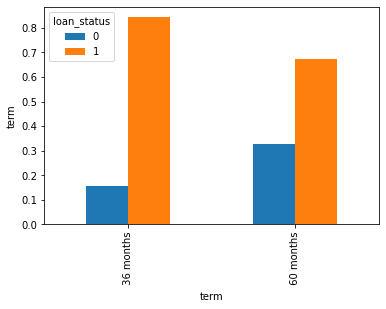

<Figure size 432x288 with 0 Axes>

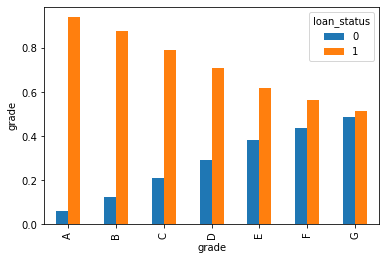

<Figure size 432x288 with 0 Axes>

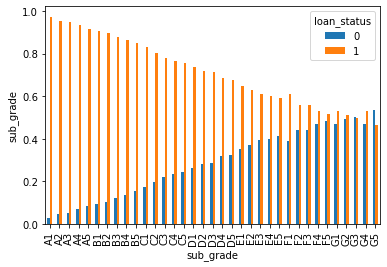

<Figure size 432x288 with 0 Axes>

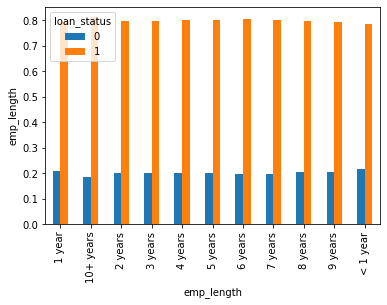

<Figure size 432x288 with 0 Axes>

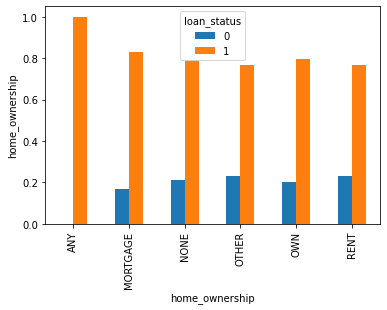

<Figure size 432x288 with 0 Axes>

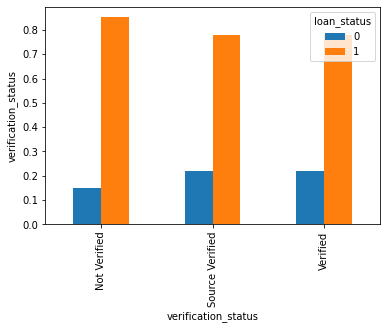

<Figure size 432x288 with 0 Axes>

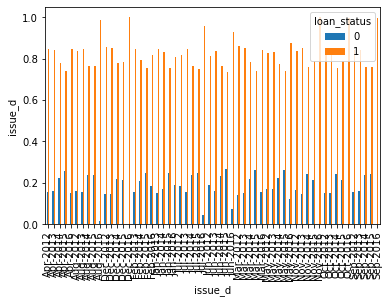

<Figure size 432x288 with 0 Axes>

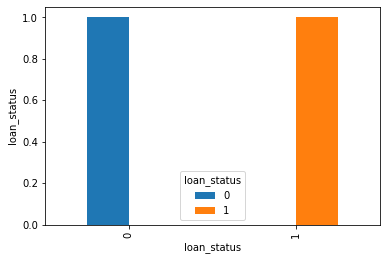

<Figure size 432x288 with 0 Axes>

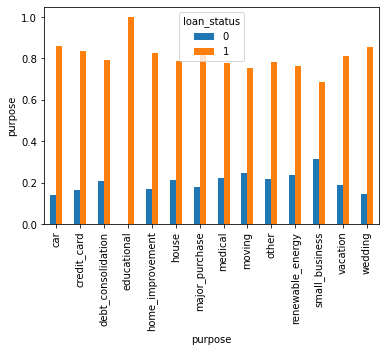

<Figure size 432x288 with 0 Axes>

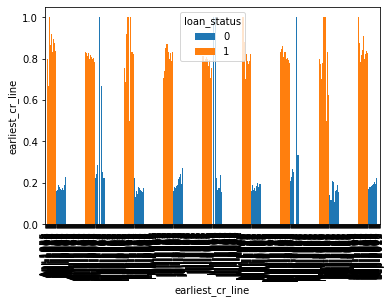

<Figure size 432x288 with 0 Axes>

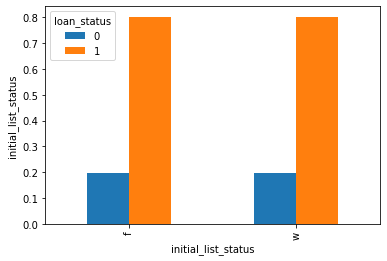

<Figure size 432x288 with 0 Axes>

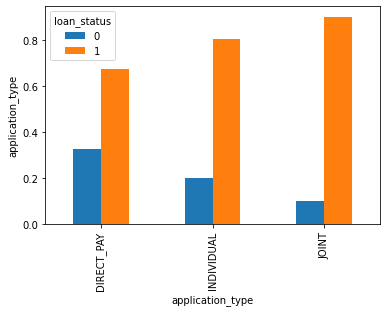

In [27]:
for item in temp:
    count = count +1
    plot_new(data,item,'loan_status',count)
# data['emp_title'].uniq

In [28]:
cols

['term',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'purpose',
 'title',
 'earliest_cr_line',
 'initial_list_status',
 'application_type']

In [29]:
# for categorical data count number of categories 
# observe the categories
print(30*'*')
for item in cols:
    print(item,end=':')
    print(len(data[item].unique()))
    print(data[item].value_counts(ascending=False).head(5))
#     print(data[item].unique())
    print(30*'*')

******************************
term:2
 36 months    254776
 60 months     81092
Name: term, dtype: int64
******************************
grade:7
B    98008
C    92213
D    54640
A    51123
E    27123
Name: grade, dtype: int64
******************************
sub_grade:35
B3    22329
B4    21820
C1    20273
C2    19369
B2    19238
Name: sub_grade, dtype: int64
******************************
emp_title:150833
Teacher             4367
Manager             4231
Registered Nurse    1841
RN                  1840
Supervisor          1812
Name: emp_title, dtype: int64
******************************
emp_length:11
10+ years    115200
2 years       31393
3 years       27448
< 1 year      27366
5 years       22974
Name: emp_length, dtype: int64
******************************
home_ownership:6
MORTGAGE    170832
RENT        133932
OWN          31045
OTHER           30
NONE            28
Name: home_ownership, dtype: int64
******************************
verification_status:3
Source Verified    115687
Verif

<p>Follow this tutorial</p>
<a href= https://www.youtube.com/watch?v=6WDFfaYtN6s&list=PLZoTAELRMXVPwYGE2PXD3x0bfKnR0cJjN> Follow this krish Naayak tutorial </href>
<!-- <p><a href="https://www.w3schools.com/">Visit W3Schools.com!</a></p> -->

<h3><u>Feature engineering and One-Hot Encoding</u></h3>
<p>
    We choose the strategy of picking the 10 most frequent <br/>
    categories from each column, this strategy has proven to be <br/>
    successful previously.
</p>

In [30]:
cols

['term',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'purpose',
 'title',
 'earliest_cr_line',
 'initial_list_status',
 'application_type']

In [31]:
# convert all the categorical variables 
# into one hot encoding method
for col in cols :
    if col=='loan_status':
        continue
#     print(eval(col))
    top_10 = data[col].value_counts().sort_values(ascending=False).head(5)
    top_10 = list(top_10.index)
#     print(top_10)
    for label in top_10:
        data[str(col)+'_'+str(label)] = np.where(data[col]==label,1,0)
    data.drop([col], axis=1, inplace = True)

In [32]:
len(data.columns)

68

In [33]:
data.head()

,loan_amnt,int_rate,installment,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,...,earliest_cr_line_Aug-2001,earliest_cr_line_Oct-2000,earliest_cr_line_Aug-2000,earliest_cr_line_Oct-2001,earliest_cr_line_Aug-2002,initial_list_status_f,initial_list_status_w,application_type_INDIVIDUAL,application_type_JOINT,application_type_DIRECT_PAY
0,10000.0,11.44,329.48,117000.0,1,26.24,16.0,0.0,36369.0,41.8,...,0,0,0,0,0,0,1,1,0,0
1,8000.0,11.99,265.68,65000.0,1,22.05,17.0,0.0,20131.0,53.3,...,0,0,0,0,0,1,0,1,0,0
2,15600.0,10.49,506.97,43057.0,1,12.79,13.0,0.0,11987.0,92.2,...,0,0,0,0,0,1,0,1,0,0
3,7200.0,6.49,220.65,54000.0,1,2.60,6.0,0.0,5472.0,21.5,...,0,0,0,0,0,1,0,1,0,0
4,24375.0,17.27,609.33,55000.0,0,33.95,13.0,0.0,24584.0,69.8,...,0,0,0,0,0,1,0,1,0,0


In [34]:
# data.drop(['address'], axis=1, inplace = True)
scaler = StandardScaler()
# fit and transform the data
# data = scaler.fit_transform(data)

In [35]:
y = data['loan_status']
X = data.drop(['loan_status'], axis=1)
X_cols= X.columns
tempX = scaler.fit_transform(X)
X=pd.DataFrame(tempX, columns=X_cols)
# y = scaler.fit_transform(y.reshape(-1, 1))

In [36]:
from imblearn.over_sampling import SMOTE
os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y,
test_size=0.3, random_state=0)
columns = X_train.columns
os_data_X,os_data_y=os.fit_resample(X_train, y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=columns )
os_data_yy= pd.DataFrame(data=os_data_y,columns=['loan_status'])

In [37]:
# we can Check the numbers of our data
print("length of oversampled data is ",len(os_data_X))
print('After OverSampling, the shape of train_X: {}'.format(os_data_X.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(os_data_y.shape))
print("After OverSampling, counts of label '1': {}".format(sum(os_data_y == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(os_data_y == 0)))

length of oversampled data is  377080
After OverSampling, the shape of train_X: (377080, 67)
After OverSampling, the shape of train_y: (377080,) 

After OverSampling, counts of label '1': 188540
After OverSampling, counts of label '0': 188540


In [38]:
# X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3,stratify=y,random_state=0)

In [39]:
os_data_yy.value_counts()

loan_status
0              188540
1              188540
dtype: int64

In [40]:
# pipe = make_pipeline(StandardScaler(), LogisticRegression())

In [41]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=10000)
rfe = RFE(estimator=logreg, n_features_to_select=20)
rfe = rfe.fit(os_data_X, os_data_yy.values.ravel())
print(rfe.support_)
print(rfe.ranking_)

[ True  True  True  True  True  True False False  True  True  True False
  True  True  True False False  True False False False False False False
 False False False False False False False False False False  True  True
  True False False False False False False False False False False  True
  True False False False  True  True False False False False False False
 False False False False False False False]
[ 1  1  1  1  1  1 33  4  1  1  1 13  1  1  1  5  7  1 15 34 19  6 11 14
 40 32 42 39 41 22 21 23 30 26  1  1  1 35 44  9 45 18 16 27 28 17 29  1
  1 36  2 31  1  1 12  3 20 48 38 43 47 37 10 25 24  8 46]


In [42]:
print(os_data_X.columns[rfe.support_])
req_cols = os_data_X.columns[rfe.support_]

Index(['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'open_acc',
       'revol_util', 'total_acc', 'mort_acc', 'term_ 36 months',
       'term_ 60 months', 'grade_B', 'grade_A', 'home_ownership_MORTGAGE',
       'home_ownership_RENT', 'home_ownership_OWN',
       'purpose_debt_consolidation', 'purpose_credit_card',
       'title_Debt consolidation', 'title_Credit card refinancing'],
      dtype='object')


In [43]:
req_cols = list(req_cols)
req_cols

['loan_amnt',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'open_acc',
 'revol_util',
 'total_acc',
 'mort_acc',
 'term_ 36 months',
 'term_ 60 months',
 'grade_B',
 'grade_A',
 'home_ownership_MORTGAGE',
 'home_ownership_RENT',
 'home_ownership_OWN',
 'purpose_debt_consolidation',
 'purpose_credit_card',
 'title_Debt consolidation',
 'title_Credit card refinancing']

In [44]:
X_train_new = os_data_X[req_cols]
x_test_new = X_test[req_cols]
y_train_new = os_data_yy.values.reshape(-1,1)

In [45]:
import statsmodels.api as sm
logit_model=sm.Logit(y_train_new,X_train_new)
result=logit_model.fit()
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.620505
         Iterations 5
                                Results: Logit
Model:                  Logit                Pseudo R-squared:     0.105      
Dependent Variable:     y                    AIC:                  467997.9183
Date:                   2023-01-18 08:05     BIC:                  468203.8823
No. Observations:       377080               Log-Likelihood:       -2.3398e+05
Df Model:               18                   LL-Null:              -2.6137e+05
Df Residuals:           377061               LLR p-value:          0.0000     
Converged:              1.0000               Scale:                1.0000     
No. Iterations:         5.0000                                                
------------------------------------------------------------------------------
                               Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-------------------------------------------------------------

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X_train_new, y_train_new,
test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Anaconda_install\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [47]:
len(X_test.columns)

20

In [48]:
y_pred = logreg.predict(X_test)
print('Accuracy of logistic regression classifier on test set:{:.2f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set:0.66


In [49]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, y_pred)
print(confusion_matrix)

[[39007 17271]
 [20650 36196]]


In [50]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.69      0.67     56278
           1       0.68      0.64      0.66     56846

    accuracy                           0.66    113124
   macro avg       0.67      0.66      0.66    113124
weighted avg       0.67      0.66      0.66    113124



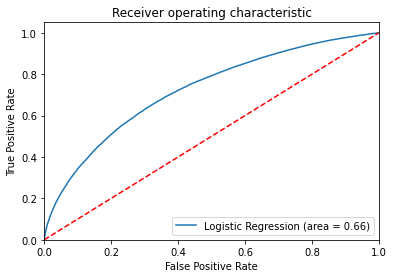

In [51]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

Plot the Precision-Recall curve

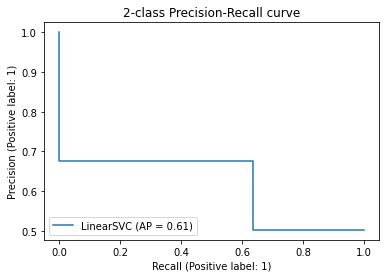

In [53]:
from sklearn.metrics import PrecisionRecallDisplay
display = PrecisionRecallDisplay.from_predictions(y_test, y_pred, name="LinearSVC")
_ = display.ax_.set_title("2-class Precision-Recall curve")
